<a href="https://colab.research.google.com/github/Ahmed-Magdi1/Lab3_Machine_Vision/blob/main/Lab3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Question_2

## 1. Use an image you own or have captured (image.jpg).

In [111]:
# Important libraries
import  cv2 as cv  #Define computer vision library
import numpy as np #Define numpy library
from matplotlib import pyplot as plt #Define matplotlib library

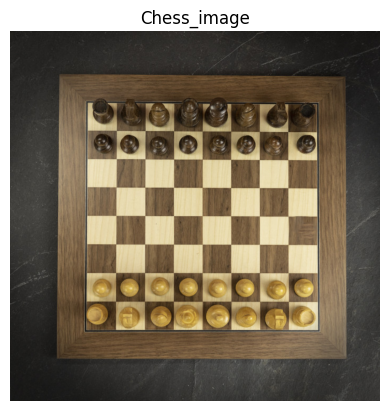

In [115]:
colored_image = cv.imread('/content/chess.jpg') #Read the image
rgb_image = cv.cvtColor(colored_image, cv.COLOR_BGR2RGB) #Convert the image from BGR to RGB
plt.imshow(rgb_image) #Show the image
plt.title('Chess_image')  # Set the title
plt.axis('off')  # Turn off the axis
plt.show()  # Show the plot

## 2. Apply the following transformations to the image and determine the corresponding transformation matrix H for each case:

### a. Translate the image by two different sets of points (𝑥1,𝑦1) and (𝑥2,𝑦2).

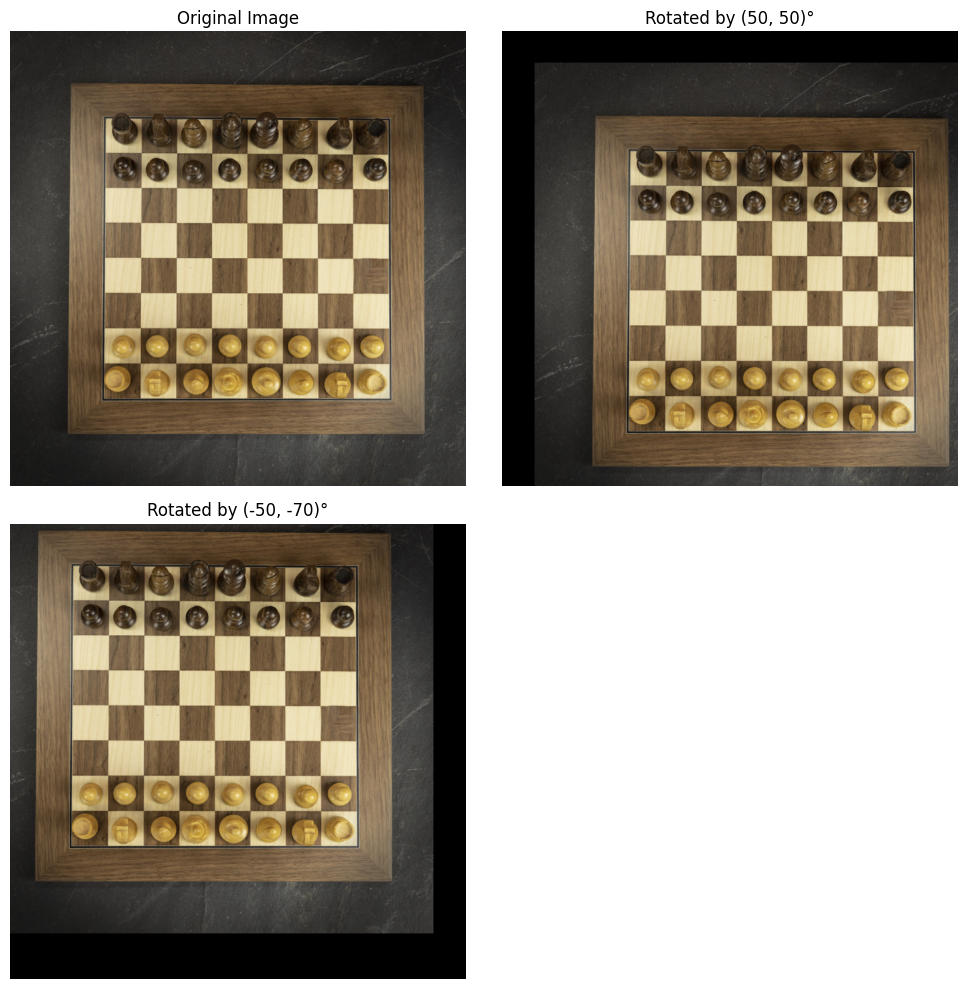

In [60]:
# The translation vectors (x1, y1) and (x2, y2)
T1 = (50, 50)  # Translation by (x1, y1)
T2 = (-50, -70)  # Translation by (x2, y2)

# Translation matrices
H1 = np.float32([[1, 0, T1[0]], [0, 1, T1[1]]])  # For translation by (x1, y1)
H2 = np.float32([[1, 0, T2[0]], [0, 1, T2[1]]])  # For translation by (x2, y2)

# Apply the translation
translated_image1 = cv.warpAffine(rgb_image, H1, (colored_image.shape[1], colored_image.shape[0]))
translated_image2 = cv.warpAffine(rgb_image, H2, (colored_image.shape[1], colored_image.shape[0]))

# Grid for plotitng
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# The original image
axes[0, 0].imshow(rgb_image)
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# The rotated images
axes[0, 1].imshow(translated_image1)
axes[0, 1].set_title(f'Rotated by {T1}°')
axes[0, 1].axis('off')

axes[1, 0].imshow(translated_image2)
axes[1, 0].set_title(f'Rotated by {T2}°')
axes[1, 0].axis('off')
axes[1, 1].axis('off')  # Leave the bottom-right cell empty

plt.tight_layout()
plt.show()

Transformation matrix H:

H_1=
\begin{bmatrix}
1 & 0 & x_1 \\
0 & 1 & y_1 \\
0 & 0 & 1
\end{bmatrix}


H_2=
\begin{bmatrix}
1 & 0 & x_2 \\
0 & 1 & y_2 \\
0 & 0 & 1
\end{bmatrix}



### b. Rotate the image by two different angles 𝜃1 and 𝜃2.

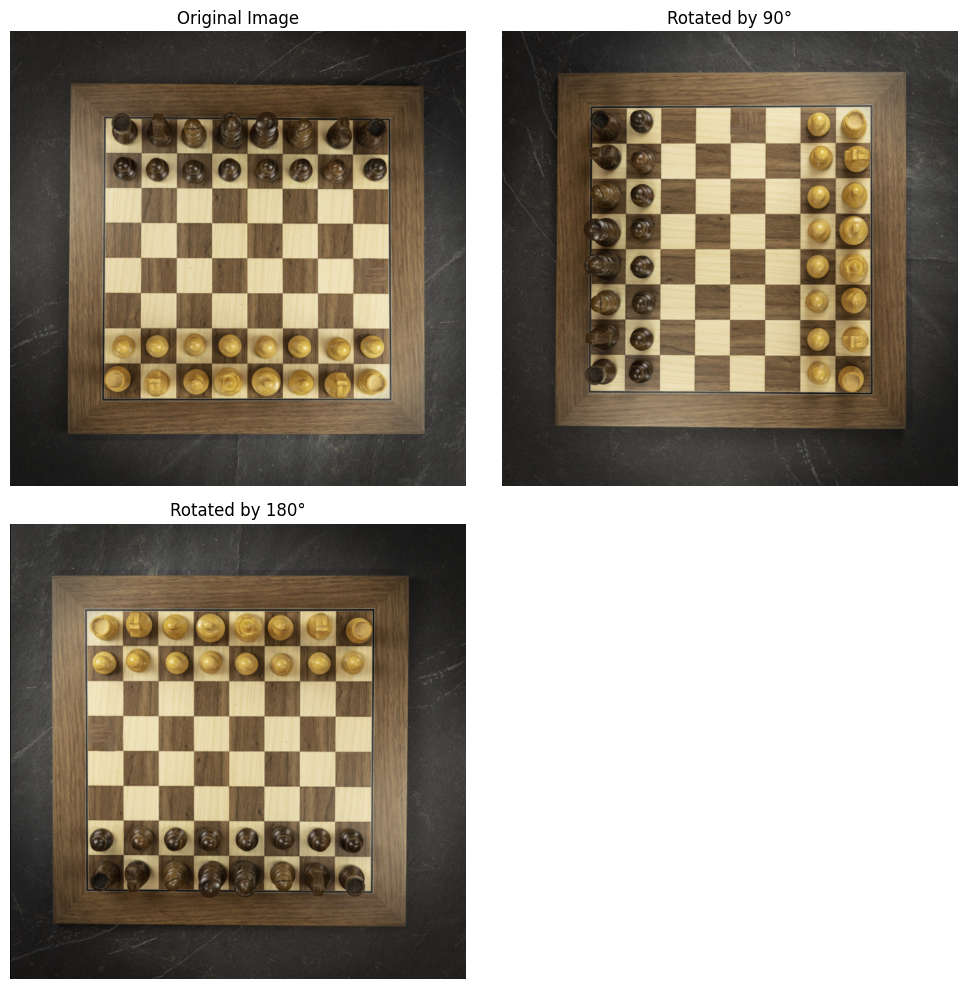

In [34]:
# The rotation angles (theta1, theta2)
theta1 = 90  # Rotation by 90 degrees
theta2 = 180  # Rotation by 180 degrees

# Image center
center = (rgb_image.shape[1] // 2, rgb_image.shape[0] // 2)

# The rotation matrices
M1 = cv.getRotationMatrix2D(center, theta1, 1)  # Scale factor (1 = no scaling)
M2 = cv.getRotationMatrix2D(center, theta2, 1)

# Apply the rotations
rotated_image1 = cv.warpAffine(rgb_image, M1, (rgb_image.shape[1], rgb_image.shape[0]))
rotated_image2 = cv.warpAffine(rgb_image, M2, (rgb_image.shape[1], rgb_image.shape[0]))

# Grid for plotting
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Display the original image
axes[0, 0].imshow(rgb_image)
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# Display the rotated images
axes[0, 1].imshow(rotated_image1)
axes[0, 1].set_title(f'Rotated by {theta1}°')
axes[0, 1].axis('off')

axes[1, 0].imshow(rotated_image2)
axes[1, 0].set_title(f'Rotated by {theta2}°')
axes[1, 0].axis('off')
axes[1, 1].axis('off')  # Leave the bottom-right cell empty

plt.tight_layout()
plt.show()

Transformation matrix H:

H = \begin{bmatrix}
\cos(\theta) & -\sin(\theta) & (1 - \cos(\theta)) \cdot c_x + \sin(\theta) \cdot c_y \\
\sin(\theta) & \cos(\theta) & (1 - \cos(\theta)) \cdot c_y - \sin(\theta) \cdot c_x \\
0 & 0 & 1
\end{bmatrix}

(c_x, c_y​) is the center of rotation(image)

### c. Perform scaling to enlarge (scale up) and reduce (scale down) the image.

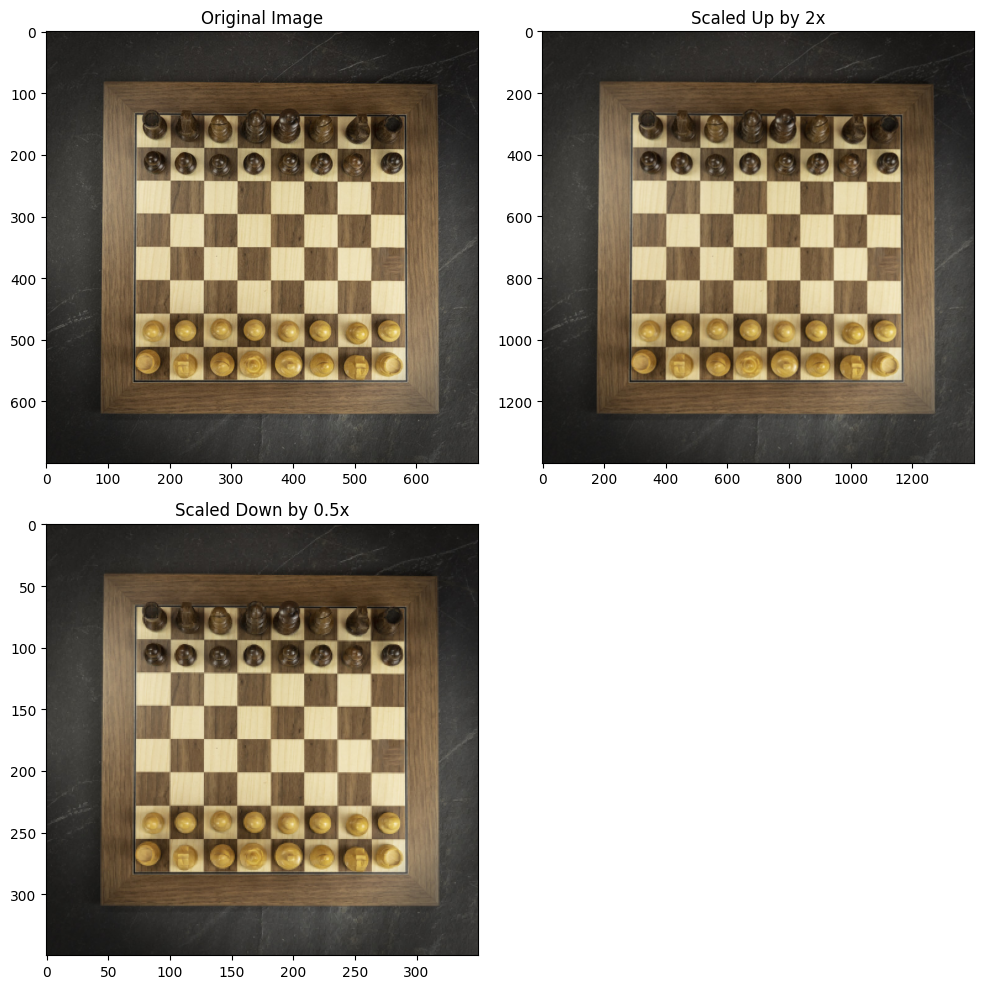

In [35]:
# Scaling factors
scale_up = 2 # 2x larger
scale_down = 0.5  # 0.5x smaller

# Apply scaling
scaled_up_image = cv.resize(rgb_image, None, fx=scale_up, fy=scale_up, interpolation=cv.INTER_LINEAR)
scaled_down_image = cv.resize(rgb_image, None, fx=scale_down, fy=scale_down, interpolation=cv.INTER_LINEAR)

# Grid for plotting
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Display the original image
axes[0, 0].imshow(rgb_image)
axes[0, 0].set_title('Original Image')


# Display the scaled-up and scaled-down images
axes[0, 1].imshow(scaled_up_image)
axes[0, 1].set_title(f'Scaled Up by {scale_up}x')

axes[1, 0].imshow(scaled_down_image)
axes[1, 0].set_title(f'Scaled Down by {scale_down}x')
axes[1, 1].axis('off')  # Leave the bottom-right cell empty

plt.tight_layout()
plt.show()

Transformation matrix H:


H = \begin{bmatrix}
s_x & 0 & 0 \\
0 & s_y & 0 \\
0 & 0 & 1
\end{bmatrix}


(s_x, s_y) : The scalling factors

### d. Apply a projective transformation.

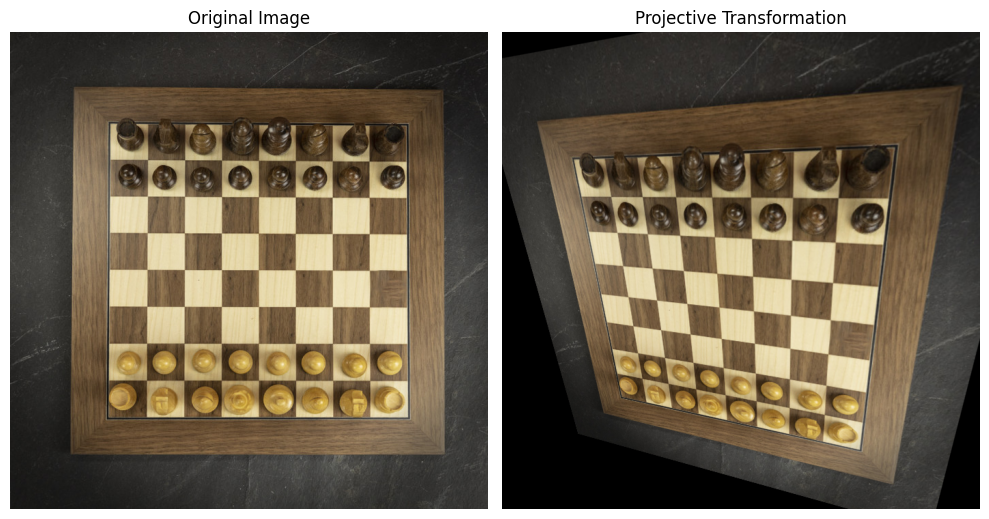

In [49]:
# The points (source and destination)

# Source points (original image coordinates)
src_pts = np.float32([[50, 50], [450, 50], [50, 450], [450, 450]])

# Destination points (perspective points)
dst_pts = np.float32([[10, 100], [400, 50], [100, 450], [400, 500]])

# The perspective transformation matrix
K = cv.getPerspectiveTransform(src_pts, dst_pts)

# Apply the projective transformation
projected_image = cv.warpPerspective(rgb_image, K, (rgb_image.shape[1], rgb_image.shape[0]))

# Grid plotting
fig, axes = plt.subplots(1, 2, figsize=(10, 10))

# Display the original image
axes[0].imshow(rgb_image)
axes[0].set_title('Original Image')
axes[0].axis('off')

# Display the projected image
axes[1].imshow(projected_image)
axes[1].set_title('Projective Transformation')
axes[1].axis('off')

plt.tight_layout()
plt.show()

Transformation matrix H:


H = \begin{bmatrix}
h_1 & h_2 & h_3 \\
h_4 & h_5 & h_6 \\
h_7 & h_8 & 1
\end{bmatrix}

(h1, h2, h3, h4, h5, h6, h7, h8) : The selected points.

### e. Perform a combination of translation and rotation.

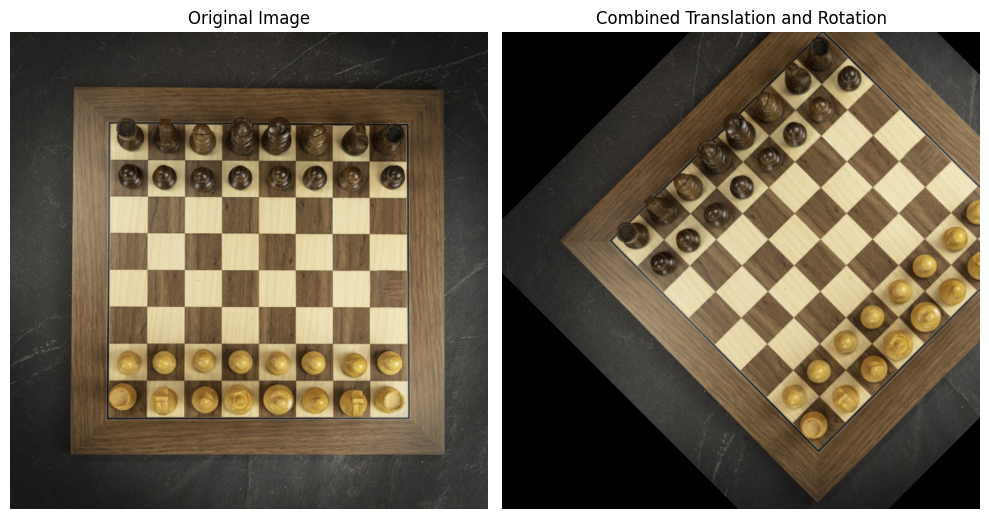

In [129]:
t_x = 100  # translation along the x-axis
t_y = 50   # translation along the y-axis

theta = 45  # rotate by 45 degrees

# The image center for rotation
center = (rgb_image.shape[1] // 2, rgb_image.shape[0] // 2)

# The translation matrix
T = np.float32([[1, 0, t_x], [0, 1, t_y]])

# The rotation matrix (the rotation is around the center)
R = cv.getRotationMatrix2D(center, theta, 1)  # The scale factor (1 = no scaling)

# First apply the translation, then apply the rotation
combined_matrix = np.vstack([R, [0, 0, 1]])  # Convert R to a 3x3 matrix by adding [0, 0, 1] as the third row
combined_matrix = combined_matrix @ np.vstack([T, [0, 0, 1]])  # Translation

# Apply the combined transformation
transformed_image = cv.warpAffine(rgb_image, combined_matrix[:2, :], (rgb_image.shape[1], rgb_image.shape[0]))

# Grid for plotting
fig, axes = plt.subplots(1, 2, figsize=(10, 10))

# Display the original image
axes[0].imshow(rgb_image)
axes[0].set_title('Original Image')
axes[0].axis('off')

# Display the transformed image
axes[1].imshow(transformed_image)
axes[1].set_title(f'Combined Translation and Rotation')
axes[1].axis('off')

plt.tight_layout()
plt.show()

Transformation matrix H:

Translation Matrix:

T = \begin{bmatrix}
1 & 0 & t_x \\
0 & 1 & t_y \\
0 & 0 & 1
\end{bmatrix}


Rotation Matrix:

R = \begin{bmatrix}
\cos(\theta) & -\sin(\theta) & 0 \\
\sin(\theta) & \cos(\theta) & 0 \\
0 & 0 & 1
\end{bmatrix}

Overall Matrix:

H = \begin{bmatrix}
\cos(\theta) & -\sin(\theta) & t_x \\
\sin(\theta) & \cos(\theta) & t_y \\
0 & 0 & 1
\end{bmatrix}



### f. Perform a combination of (a), (b), (c) and (d).

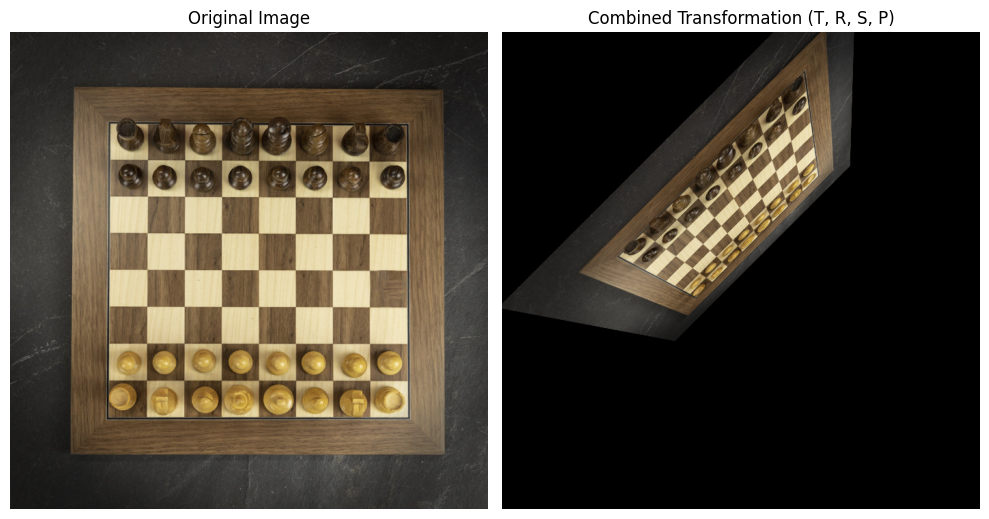

In [59]:
t_x = 100  # translation along the x-axis
t_y = 50   # translation along the y-axis

theta = 45  # rotate by 45 degrees

s_x = 1.5  # scale along the x-axis
s_y = 1.5  # scale along the y-axis

# The projective transformation matrix
h_1, h_2, h_3, h_4, h_5, h_6, h_7, h_8 = 1, 0, 50, 0, 1, 100, 0.001, 0.001  # Projective transformation

# Create the translation matrix (from 2x3 to 3x3 by adding a row of [0, 0, 1])
T = np.float32([[1, 0, t_x], [0, 1, t_y], [0, 0, 1]])

# Create the rotation matrix (from 2x3 to 3x3 by adding a row of [0, 0, 1])
R = cv.getRotationMatrix2D((rgb_image.shape[1] // 2, rgb_image.shape[0] // 2), theta, 1)
R = np.vstack([R, [0, 0, 1]])  # Convert to 3x3 matrix

# Create the scaling matrix (from 2x3 to 3x3 by adding a row of [0, 0, 1])
S = np.float32([[s_x, 0, 0], [0, s_y, 0], [0, 0, 1]])

# The projective transformation matrix
P = np.float32([[h_1, h_2, h_3], [h_4, h_5, h_6], [h_7, h_8, 1]])

### Combine the matrices ###
# Apply T -> R -> S -> P
H_final = P @ S @ R @ T

# The final combined transformation
final_transformed_image = cv.warpPerspective(rgb_image, H_final, (rgb_image.shape[1], rgb_image.shape[0]))

# Grid from plotting
fig, axes = plt.subplots(1, 2, figsize=(10, 10))

# Display the original image
axes[0].imshow(rgb_image)
axes[0].set_title('Original Image')
axes[0].axis('off')

# Display the final transformed image
axes[1].imshow(final_transformed_image)
axes[1].set_title('Combined Transformation (T, R, S, P)')
axes[1].axis('off')

plt.tight_layout()
plt.show()

Transformation matrix H:

Translation Matrix:

   T = \begin{bmatrix}
   1 & 0 & t_x \\
   0 & 1 & t_y \\
   0 & 0 & 1
   \end{bmatrix}

Rotation Matrix:

  R = \begin{bmatrix}
    \cos(\theta) & -\sin(\theta) & 0 \\
    \sin(\theta) & \cos(\theta) & 0 \\
    0 & 0 & 1
    \end{bmatrix}

Scaling Matrix:

   S = \begin{bmatrix}
   s_x & 0 & 0 \\
   0 & s_y & 0 \\
   0 & 0 & 1
   \end{bmatrix}

Projective Transformation Matrix:

   P = \begin{bmatrix}
   h_1 & h_2 & h_3 \\
   h_4 & h_5 & h_6 \\
   h_7 & h_8 & 1
   \end{bmatrix}

Overall Matrix:

\begin{bmatrix}P \cdot S \cdot R \cdot T
\end{bmatrix}




### g. Display the original and transformed images.

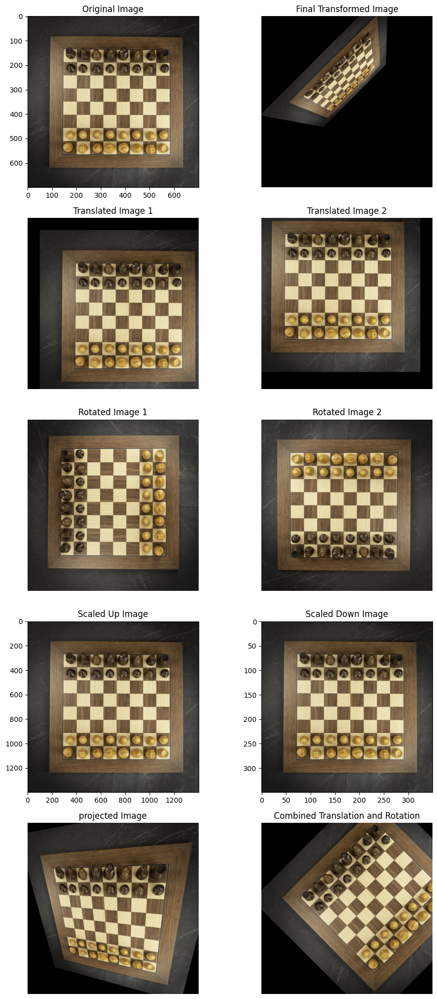

In [130]:
# Grid for plotting
fig, axes = plt.subplots(5, 2, figsize=(10, 20))

# Display the original image and final image
axes[0, 0].imshow(rgb_image)
axes[0, 0].set_title("Original Image")
axes[0, 0].axis('on')

axes[0, 1].imshow(final_transformed_image)
axes[0, 1].set_title("Final Transformed Image")
axes[0, 1].axis('off')

# Transformed images
axes[1, 0].imshow(translated_image1)
axes[1, 0].set_title("Translated Image 1")
axes[1, 0].axis('off')

axes[1, 1].imshow(translated_image2)
axes[1, 1].set_title("Translated Image 2")
axes[1, 1].axis('off')

# Rotating images
axes[2, 0].imshow(rotated_image1)
axes[2, 0].set_title("Rotated Image 1")
axes[2, 0].axis('off')

axes[2, 1].imshow(rotated_image2)
axes[2, 1].set_title("Rotated Image 2")
axes[2, 1].axis('off')

# Scaled images
axes[3, 0].imshow(scaled_up_image)
axes[3, 0].set_title("Scaled Up Image")
axes[3, 0].axis('on')

axes[3, 1].imshow(scaled_down_image)
axes[3, 1].set_title("Scaled Down Image")
axes[3, 1].axis('on')

# Projected image
axes[4, 0].imshow(projected_image)
axes[4, 0].set_title("projected Image")
axes[4, 0].axis('off')

# Combined Translation and Rotation image
axes[4, 1].imshow(transformed_image)
axes[4, 1].set_title("Combined Translation and Rotation")
axes[4, 1].axis('off')

plt.tight_layout()
plt.show()

## 3. Detect key points in the original image and all transformed images using SIFT.

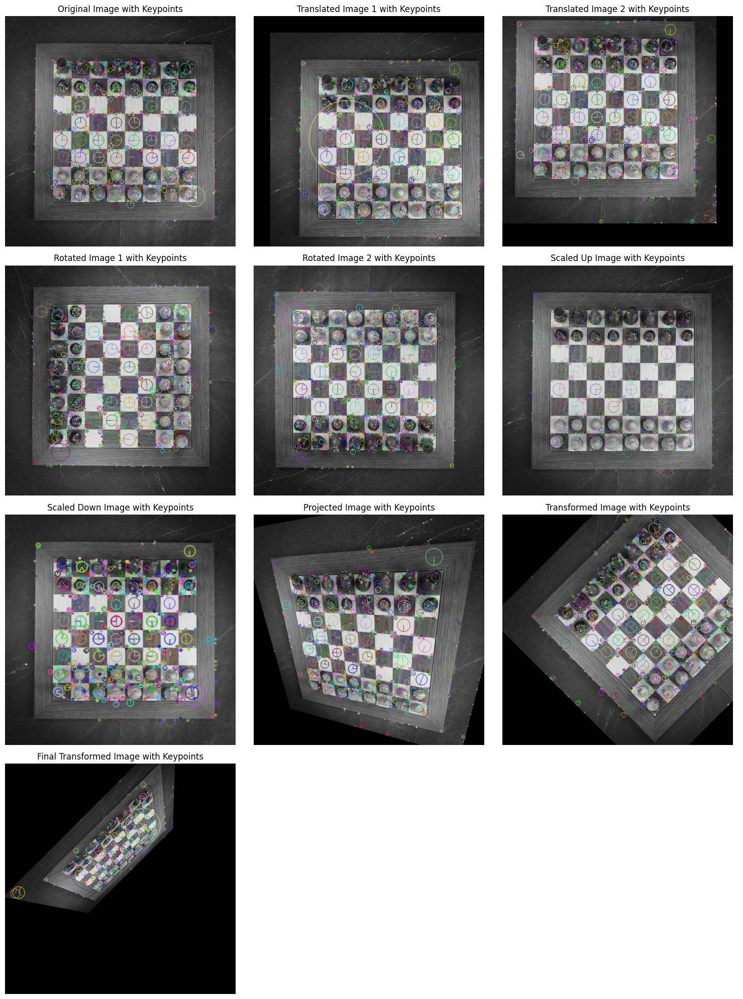

In [133]:
# Convert the original image to grayscale
gray_image = cv.cvtColor(rgb_image, cv.COLOR_BGR2GRAY)

# The SIFT detector
sift = cv.SIFT_create()

# Detect key points and descriptors on the original grayscale image
keypoints, descriptors = sift.detectAndCompute(gray_image, None)

# Draw keypoints on the original image
original_with_keypoints = cv.drawKeypoints(gray_image, keypoints, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Create grayscale versions of the transformed images
transformed_images = [translated_image1, translated_image2, rotated_image1, rotated_image2,
                      scaled_up_image, scaled_down_image, projected_image, transformed_image, final_transformed_image]

# Convert all transformed images to grayscale
gray_transformed_images = [cv.cvtColor(transformed, cv.COLOR_RGB2GRAY) for transformed in transformed_images]

# Image titles for each transformation
image_titles = [
    "Original Image with Keypoints",
    "Translated Image 1 with Keypoints",
    "Translated Image 2 with Keypoints",
    "Rotated Image 1 with Keypoints",
    "Rotated Image 2 with Keypoints",
    "Scaled Up Image with Keypoints",
    "Scaled Down Image with Keypoints",
    "Projected Image with Keypoints",
    "Transformed Image with Keypoints",
    "Final Transformed Image with Keypoints"
]

# Grid for plotting
fig, axes = plt.subplots(4, 3, figsize=(15, 20))

# Display the original grayscale image with keypoints
axes[0, 0].imshow(original_with_keypoints, cmap='gray')  # Display in grayscale
axes[0, 0].set_title(image_titles[0])  # Title for original image
axes[0, 0].axis('off')  # Hide axis labels

# Loop through the transformed grayscale images and detect key points
for i, gray_transformed in enumerate(gray_transformed_images):
    # Detect keypoints and descriptors in the transformed grayscale images
    keypoints_transformed, descriptors_transformed = sift.detectAndCompute(gray_transformed, None)

    # Draw keypoints on the transformed grayscale image
    transformed_with_keypoints = cv.drawKeypoints(gray_transformed,
                                                  keypoints_transformed, None,
                                                  flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # Display the transformed image with keypoints in the grid
    row, col = divmod(i + 1, 3)
    axes[row, col].imshow(transformed_with_keypoints, cmap='gray')  # Display in grayscale
    axes[row, col].set_title(image_titles[i + 1])  # Title for each transformed image
    axes[row, col].axis('off')

# Hide empty axes
axes[3, 1].axis('off')
axes[3, 2].axis('off')

plt.tight_layout()
plt.show()

## 4. Match the SIFT descriptors using Euclidean distance.

In [143]:
# Function to match descriptors using Euclidean distance
def match_descriptors(descriptors1, descriptors2):
    # The Brute Force Matcher with Euclidean distance (NORM_L2)
    bf = cv.BFMatcher(cv.NORM_L2, crossCheck=True)
    matches = bf.match(descriptors1, descriptors2)
    return matches

# List to store matches for each image comparison
all_matches = []

# Match descriptors for each transformed image against the original image
for transformed in transformed_images:
    gray_transformed = cv.cvtColor(transformed, cv.COLOR_BGR2GRAY)  # Convert to grayscale
    keypoints_transformed, descriptors_transformed = sift.detectAndCompute(gray_transformed, None)

    # Match descriptors between the original and transformed image
    matches = match_descriptors(descriptors, descriptors_transformed)
    all_matches.append(matches)


## 5. Visualize the matched points between the two images.

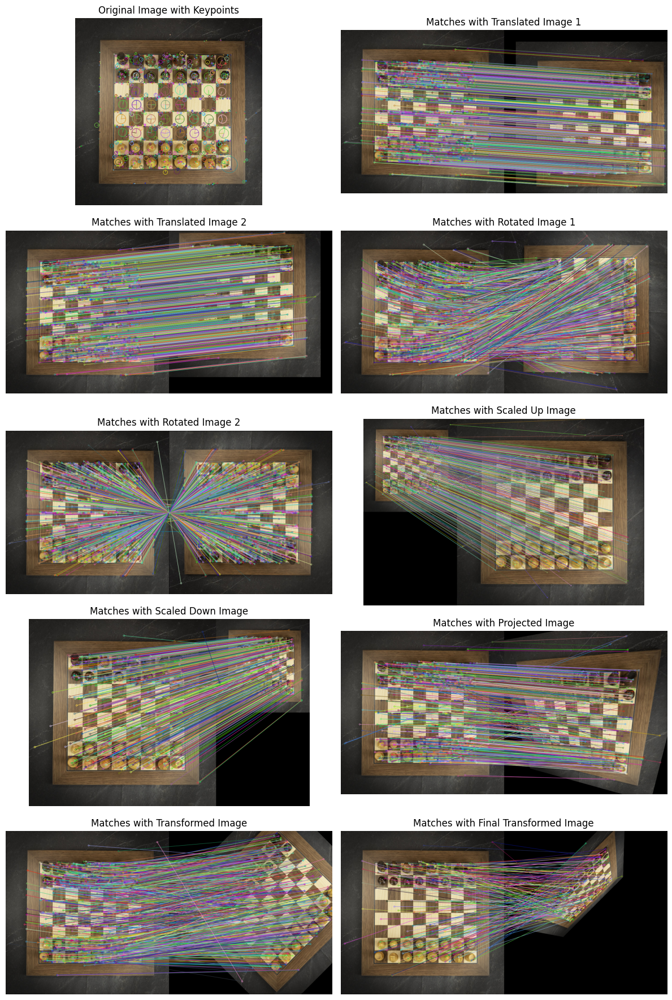

In [145]:
# List of transformation names for display
transformation_names = [
    "Translated Image 1", "Translated Image 2", "Rotated Image 1", "Rotated Image 2",
    "Scaled Up Image", "Scaled Down Image", "Projected Image", "Transformed Image", "Final Transformed Image"
]

# Grid for visualizing matches
fig, axes = plt.subplots(5, 2, figsize=(12, 18))

# Original image with its keypoints
original_with_keypoints = cv.drawKeypoints(rgb_image, keypoints, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display original image with keypoints
axes[0, 0].imshow(original_with_keypoints)
axes[0, 0].set_title("Original Image with Keypoints")
axes[0, 0].axis('off')

# Loop through the transformed images and display matches
for i, (transformed, matches) in enumerate(zip(transformed_images, all_matches)):
    gray_transformed = cv.cvtColor(transformed, cv.COLOR_BGR2GRAY)  # Convert to grayscale
    keypoints_transformed, _ = sift.detectAndCompute(gray_transformed, None)

    # Draw the matches between the original image and the transformed image
    img_matches = cv.drawMatches(rgb_image, keypoints, transformed, keypoints_transformed, matches, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    # Place the match visualization in the grid
    row = (i + 1) // 2  # Start from row 1
    col = (i + 1) % 2  # Alternate between column 0 and 1

    axes[row, col].imshow(img_matches)
    axes[row, col].set_title(f"Matches with {transformation_names[i]}")
    axes[row, col].axis('off')

# Hide empty axes
axes[4, 1].axis('off')

plt.tight_layout()
plt.show()

## 6. Compute the homography matrix H between the original image and each transformed image based on the matched key points.

In [163]:
# List of transformation names
transformation_names = [
    "Translated Image 1", "Translated Image 2", "Rotated Image 1", "Rotated Image 2",
    "Scaled Up Image", "Scaled Down Image", "Projected Image", "Transformed Image", "Final Transformed Image"
]

# Function to compute homography based on matched keypoints
def compute_homography(matches, keypoints1, keypoints2):
    points1 = []
    points2 = []

    for match in matches:
        # The coordinates of the matched keypoints
        points1.append(keypoints1[match.queryIdx].pt)
        points2.append(keypoints2[match.trainIdx].pt)

    points1 = np.float32(points1)  # Convert to float32
    points2 = np.float32(points2) # Convert to float32

    # Compute the homography matrix
    H, mask = cv.findHomography(points1, points2, cv.RANSAC)
    return H, mask

# Dictionary to store homography matrices
homographies = {}

# Compute the homography for each transformed image
for i, transformed in enumerate(transformed_images):
    gray_transformed = cv.cvtColor(transformed, cv.COLOR_BGR2GRAY)  # Convert to grayscale
    keypoints_transformed, _ = sift.detectAndCompute(gray_transformed, None)  # Detect keypoints

    # Match descriptors between the original and transformed image
    matches = all_matches[i]

    # Compute the homography matrix H
    H, mask = compute_homography(matches, keypoints, keypoints_transformed)

    # Assign the homography matrix to the dictionary with the name
    homographies[transformation_names[i]] = H

    # Print the homography matrix
    print(f"Homography Matrix for {transformation_names[i]}:\n", H)
    print("-" * 50)

Homography Matrix for Translated Image 1:
 [[1.00000911e+00 1.79811796e-05 4.99952452e+01]
 [1.41163105e-05 9.99992146e-01 4.99981309e+01]
 [7.69093297e-09 5.01926479e-10 1.00000000e+00]]
--------------------------------------------------
Homography Matrix for Translated Image 2:
 [[ 9.99981992e-01  4.67849012e-05 -5.00101757e+01]
 [-2.03078391e-05  1.00000163e+00 -6.99941142e+01]
 [-8.49376141e-08  6.62513715e-08  1.00000000e+00]]
--------------------------------------------------
Homography Matrix for Rotated Image 1:
 [[ 3.83053518e-05  1.00004215e+00 -1.81131971e-02]
 [-1.00001512e+00  3.02883373e-05  7.00499840e+02]
 [ 7.25323949e-09  5.10229165e-08  1.00000000e+00]]
--------------------------------------------------
Homography Matrix for Rotated Image 2:
 [[-1.00007855e+00  8.35809840e-05  7.00497439e+02]
 [-5.80524675e-05 -9.99929128e-01  7.00486162e+02]
 [-1.64539214e-07  1.72877711e-07  1.00000000e+00]]
--------------------------------------------------
Homography Matrix for S

## 7. Compare the computed homography matrix for each transformation with the original transformation matrix H.

In [164]:
# Transformation matrix for "Projected Image"
H_projected_image = cv.getPerspectiveTransform(src_pts, dst_pts)

# Transformation matrix for "Transformed Image"
H_transformed_image = combined_matrix

# Computed homography matrices
H_computed = {
    "Translated Image 1": np.array([[1.00000911e+00, 1.79811796e-05, 4.99952452e+01],
                                     [1.41163105e-05, 9.99992146e-01, 4.99981309e+01],
                                     [7.69093297e-09, 5.01926479e-10, 1.00000000e+00]]),
    "Translated Image 2": np.array([[9.99981992e-01, 4.67849012e-05, -5.00101757e+01],
                                     [-2.03078391e-05, 1.00000163e+00, -6.99941142e+01],
                                     [-8.49376141e-08, 6.62513715e-08, 1.00000000e+00]]),
    "Rotated Image 1": np.array([[3.83053518e-05, 1.00004215e+00, -1.81131971e-02],
                                 [-1.00001512e+00, 3.02883373e-05, 7.00499840e+02],
                                 [7.25323949e-09, 5.10229165e-08, 1.00000000e+00]]),
    "Rotated Image 2": np.array([[-1.00007855e+00, 8.35809840e-05, 7.00497439e+02],
                                 [-5.80524675e-05, -9.99929128e-01, 7.00486162e+02],
                                 [-1.64539214e-07, 1.72877711e-07, 1.00000000e+00]]),
    "Scaled Up Image": np.array([[2.00001491e+00, -9.96585287e-05, 2.86495107e-01],
                                 [-2.87881250e-05, 1.99987252e+00, 3.37220703e-01],
                                 [4.95795111e-08, 4.12793532e-08, 1.00000000e+00]]),
    "Scaled Down Image": np.array([[4.99343723e-01, 1.61731027e-04, -2.86406713e-02],
                                   [-3.61599614e-04, 4.99936386e-01, -2.56384053e-02],
                                   [-2.02441495e-06, 9.17415700e-07, 1.00000000e+00]]),
    "Projected Image": np.array([[7.23413045e-01, 3.02188675e-01, -4.11916823e+01],
                                [-1.58133414e-01, 1.22005896e+00, 4.73913953e+01],
                                [-6.42354574e-04, 7.54918505e-04, 1.00000000e+00]]),
    "Transformed Image": np.array([[7.07553876e-01, 7.07247771e-01, -3.90927586e+01],
                                   [-7.07111021e-01, 7.07382138e-01, 3.14891009e+02],
                                   [6.74315666e-07, 1.47562110e-07, 1.00000000e+00]]),
    "Final Transformed Image": np.array([[7.23393198e-01, 6.89192561e-01, 3.35499992e+00],
                                        [-7.31626592e-01, 6.74563111e-01, 4.03397111e+02],
                                        [-7.71537256e-06, 1.30541260e-03, 1.00000000e+00]]),
}

# Original transformation matrices
H_originals = {
    "Translated Image 1": np.float32([[1, 0, 50], [0, 1, 50], [0, 0, 1]]),
    "Translated Image 2": np.float32([[1, 0, -50], [0, 1, -70], [0, 0, 1]]),
    "Rotated Image 1": np.float32([[np.cos(np.radians(90)), -np.sin(np.radians(90)), 0],
                                   [np.sin(np.radians(90)), np.cos(np.radians(90)), 0],
                                   [0, 0, 1]]),
    "Rotated Image 2": np.float32([[np.cos(np.radians(180)), -np.sin(np.radians(180)), 0],
                                   [np.sin(np.radians(180)), np.cos(np.radians(180)), 0],
                                   [0, 0, 1]]),
    "Scaled Up Image": np.float32([[2, 0, 0], [0, 2, 0], [0, 0, 1]]),
    "Scaled Down Image": np.float32([[0.5, 0, 0], [0, 0.5, 0], [0, 0, 1]]),
    "Projected Image": H_projected_image,
    "Transformed Image": H_transformed_image,
    "Final Transformed Image": H_final,
}

# Function to calculate the Frobenius norm (error)
def frobenius_norm(H_computed, H_original):
    return np.linalg.norm(H_computed - H_original, 'fro')

# Compare the homographies
comparison_results = {}

for name, H_computed_matrix in H_computed.items():
    if name in H_originals:
        H_original_matrix = H_originals[name]

        # Compute the Frobenius norm (error)
        error = frobenius_norm(H_computed_matrix, H_original_matrix)

        # Store the comparison result
        comparison_results[name] = error

        # Print the comparison result
        print(f"Comparison for {name}:")
        print(f"Frobenius Norm Error: {error:.3f}")
        print("~" * 40)

Comparison for Translated Image 1:
Frobenius Norm Error: 0.005
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Comparison for Translated Image 2:
Frobenius Norm Error: 0.012
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Comparison for Rotated Image 1:
Frobenius Norm Error: 700.506
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Comparison for Rotated Image 2:
Frobenius Norm Error: 990.645
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Comparison for Scaled Up Image:
Frobenius Norm Error: 0.442
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Comparison for Scaled Down Image:
Frobenius Norm Error: 0.038
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Comparison for Projected Image:
Frobenius Norm Error: 0.095
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Comparison for Transformed Image:
Frobenius Norm Error: 0.307
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Comparison for Final Transformed Image:
Frobenius Norm Error: 168.979
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
